# Audification of tidal data from 1900 and 2000 of the coast of Santa Barbara

In [1]:
%pylab inline
from IPython.display import HTML
from __future__ import print_function
import urllib2
import json
from IPython.display import Audio

sr = 44100

Populating the interactive namespace from numpy and matplotlib


In [2]:
HTML('''<script>
code_show=false; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

This query returns the mean sea level measured from the tidal station Santa Barbara between Jan 1st 1900 to Dec 29th 1909. Measurements are taken every 6 minutes.

In [3]:
prefix = 'http://tidesandcurrents.noaa.gov/api/datagetter?'

times1900 = 'begin_date=19000101&end_date=19091229'

parameters = '&station=9411340&product=predictions&units=english&time_zone=gmt&application=ports_screen&datum=MSL'

jsonKey = '&format=json'

f = urllib2.urlopen(prefix + times1900 + parameters + jsonKey)
queryData1900 = f.read()

Another query for the same station from Jan 1st 2000 to Dec 29th 2009.

In [4]:
times2000 = 'begin_date=20000101&end_date=20091229'

f = urllib2.urlopen(prefix + times2000 + parameters + jsonKey)
queryData2000 = f.read()

In [5]:
jsonData1900 = json.loads(queryData1900)
jsonData2000 = json.loads(queryData2000)

In [6]:
jsonData1900.keys()

[u'predictions']

In [7]:
myData1900 = []
for i in jsonData1900[u'predictions']:
    myData1900.append(float(i['v']))
    
myData2000 = []
for i in jsonData2000[u'predictions']:
    myData2000.append(float(i['v']))

In [8]:
len(myData1900), len(myData2000)

(876000, 876240)

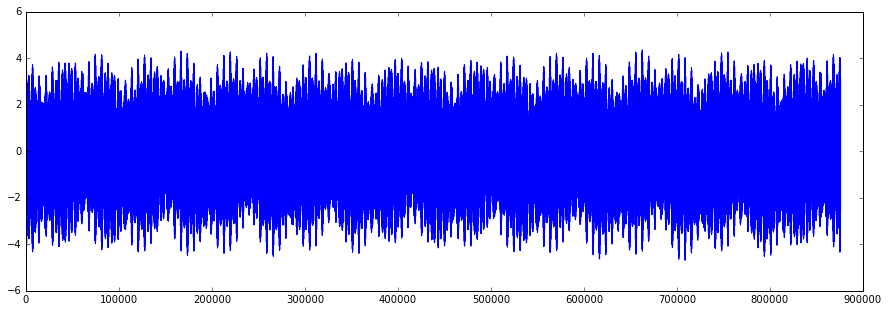

In [9]:
figure(figsize(15,5))
plot(myData1900)

Plot of Mean Sea Level from 1900-1909

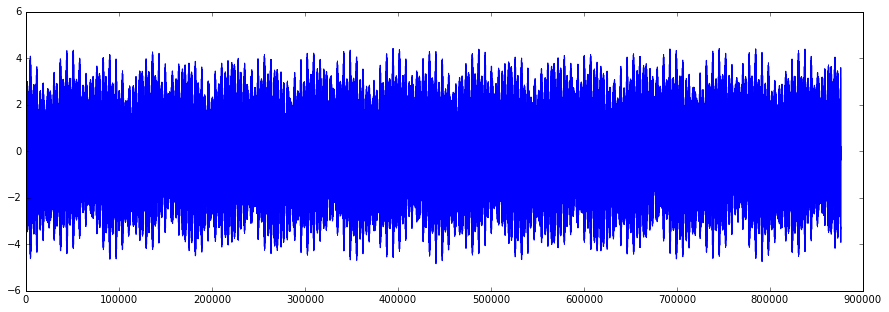

In [10]:
figure(figsize(15,5))
plot(myData2000)

Plot of Mean Sea Level from 2000-2009

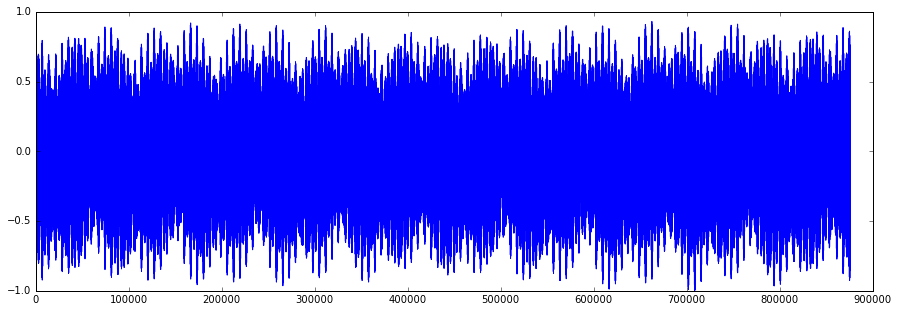

In [11]:
peak1900 = max(abs(min(myData1900)), max(myData1900))
normData1900 = [x / peak1900 for x in myData1900]
figure(figsize(15,5))
plot(normData1900)

Plot of normalized data from 1900-1909

In [12]:
output1900 = normData1900
Audio(output1900, rate = sr*1.0)

audification of data 1900-1909 at 44100 values per second

In [13]:
output1900 = normData1900
Audio(output1900, rate = sr*0.5)

audification of data 1900-1909 at 22050 values per second (half speed)

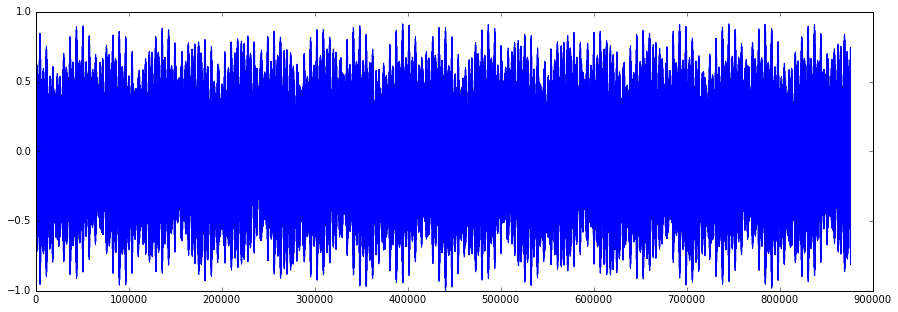

In [14]:
peak2000 = max(abs(min(myData2000)), max(myData2000))
normData2000 = [x / peak2000 for x in myData2000]
figure(figsize(15,5))
plot(normData2000)

Plot of normalized data from 2000-2009

In [15]:
output2000 = normData2000
Audio(output2000, rate = sr*1.0)

audification of data 2000-2009 at 44100 values per second

In [16]:
output2000 = normData2000
Audio(output2000, rate = sr*0.5)

audification of data 2000-2009 at 22050 values per second (half speed)

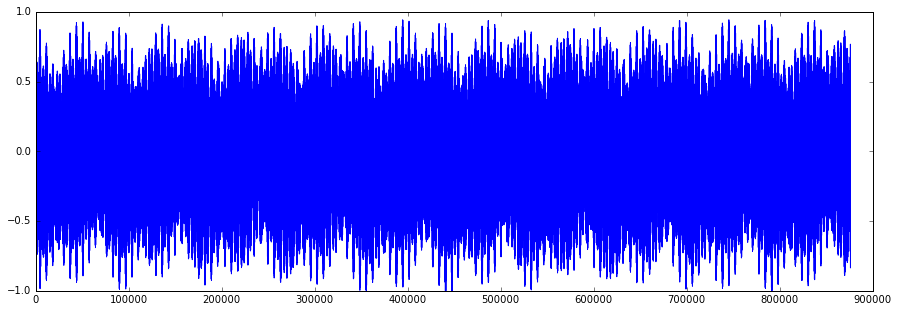

In [17]:
normData2000over1900 = [x / peak1900 for x in myData2000]
clipped2000 = numpy.clip(normData2000over1900, -1.0, 1.0)
figure(figsize(15,5))
plot(clipped2000)

Plot of data from 2000-2009, clipped at the minimum and maximum values from 1900-1909

In [18]:
outputClipped2000 = clipped2000
Audio(outputClipped2000, rate = sr*1.0)

audification of clipped data 2000-2009 at 44100 values per second

In [19]:
outputClipped2000 = clipped2000
Audio(outputClipped2000, rate = sr*0.5)

audification of clipped data 2000-2009 at 22050 values per second (half speed)

# conclusions

The data is clearly periodic and changes over time are quite subtle. Comparing the 1900 range with the 2000 range side by side shows little difference. Clipping the latter at the absolute maximum value of the 1900 range produces a soft digital clipping in some places [1], which can be easier heard at 44100 samples/second. The half speed audio examples do provide some insight into the monthly periodic tidal movements, which create repetitive pulsating patterns. 

[1]: you might not know it, but we are slowly drowning